<a href="https://colab.research.google.com/github/NastyaSNK/MISIS_DS_Masters_degree_2020/blob/master/internal_competitions/02_semesters/hakaton_1903/color.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [Intellivision](https://www.intelli-vision.com/) image clustering. Color_set research


## Loading data

In [ ]:
#Подключаем свой диск. Инструкция по ссылке: https://docs.google.com/document/d/1cMHyY9hsKCv67PyFP5rE-PgMCbmZDcdp1j9lpXvYCqE/edit?usp=sharing
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pickle

filename01 = '/content/drive/MyDrive/01_Hackathon_09/descriptors/vdc_color.pickle'
X_color = pickle.load(open(filename01, 'rb'))
print('ncolor shape:{}'.format(X_color.shape))
X_color

ncolor shape:(416314, 128)


array([[-0.9374271 , -0.05472132,  0.596811  , ..., -0.84743977,
        -0.4845666 , -0.3595275 ],
       [-0.57900274,  0.07446817,  0.80651325, ..., -0.77683306,
        -0.72354007, -0.47988674],
       [-0.58707464, -0.48330888,  0.7987211 , ..., -0.31682357,
        -0.68277246, -0.43500212],
       ...,
       [-0.68106437, -0.19239229,  0.6374473 , ..., -0.30040908,
        -0.4964002 , -0.34969243],
       [-0.62768203, -0.03720693,  0.5353278 , ..., -0.5285779 ,
        -0.64782023, -0.3015691 ],
       [-0.535808  , -0.02395482,  0.5972718 , ..., -0.5199307 ,
        -0.42627487, -0.10311161]], dtype=float32)

## Preprocessing data

In [ ]:
import pandas as pd
pd.DataFrame(X_color).describe()


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127
count,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,...,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000,416314.000000
mean,-0.568005,-0.173329,0.160370,-0.602952,-0.358000,-0.838525,-0.674464,-0.694977,-0.637064,-0.675550,-0.334049,-0.356597,-0.545003,-0.239249,-0.644646,-0.428419,0.174863,-0.058910,-0.796171,-0.449907,-0.972829,-0.648256,-0.686057,-0.175722,-0.571203,0.078777,-0.469085,0.082745,-0.387107,-0.239001,-0.575588,-0.138606,-0.604375,0.291183,-0.628993,-0.207689,-0.819993,-0.186040,0.078291,-0.332469,...,0.200136,-0.320719,-0.582557,-0.162841,-0.937933,-0.204811,-0.668268,-0.805231,-0.541199,-0.821133,-0.107009,-0.077637,-0.143555,-0.907217,0.130478,-0.130731,-0.612229,-0.357458,-0.080647,-0.684060,-0.228171,-0.804057,-0.765477,-0.308108,-0.514610,-0.007703,-0.564372,-0.006054,-0.663239,0.035784,-0.654716,-1.507951,-0.127504,-0.698786,-0.096216,-0.873865,-1.350666,-0.415347,-0.548712,-0.441730
std,0.187819,0.176132,0.467314,0.206754,0.160583,0.229040,0.227429,0.226716,0.181790,0.183409,0.206394,0.175534,0.223161,0.226467,0.230572,0.182891,0.492960,0.347103,0.191346,0.209735,0.228225,0.269165,0.202078,0.288207,0.193588,0.370774,0.193016,0.511877,0.202671,0.276097,0.180744,0.216417,0.271390,0.653339,0.200543,0.204669,0.211185,0.229670,0.419229,0.172039,...,0.592655,0.219178,0.207509,0.210672,0.263246,0.257345,0.195332,0.182471,0.190222,0.192335,0.216594,0.232106,0.287439,0.233931,0.467116,0.218215,0.215679,0.185487,0.222228,0.274489,0.192615,0.246610,0.235435,0.217512,0.183229,0.247268,0.218896,0.270920,0.184358,0.404427,0.193082,0.329624,0.263996,0.250957,0.285161,0.209614,0.301049,0.241405,0.184442,0.191388
min,-1.741313,-1.432053,-2.206050,-1.945299,-1.390456,-2.073601,-1.838179,-2.352532,-2.025867,-2.050834,-1.613020,-1.743879,-2.352129,-1.381975,-1.994156,-1.516612,-1.895940,-1.474398,-2.367963,-1.853197,-2.606767,-2.838652,-1.860951,-1.340919,-1.922013,-1.344767,-1.790083,-1.773035,-1.658221,-1.293683,-2.429413,-1.741343,-2.144629,-1.656628,-1.817281,-1.573079,-2.286441,-1.672400,-2.668886,-1.391251,...,-1.622297,-2.000234,-1.925601,-1.545210,-2.547622,-1.477198,-2.267115,-2.519211,-1.824889,-2.257880,-1.547574,-1.415815,-1.424915,-2.697265,-2.564682,-1.091827,-1.812009,-1.710017,-1.666146,-1.862612,-1.446804,-2.700426,-2.310457,-1.616056,-1.595190,-2.132720,-1.765085,-1.464098,-1.729164,-2.166766,-1.869677,-3.771573,-2.273903,-2.161817,-1.687894,-2.689885,-3.213159,-2.388843,-1.596663,-2.007680
25%,-0.683910,-0.279763,-0.245390,-0.731373,-0.458069,-0.984241,-0.821669,-0.853040,-0.747950,-0.788638,-0.465032,-0.463471,-0.669047,-0.389333,-0.797115,-0.548459,-0.248539,-0.326012,-0.911594,-0.589335,-1.109713,-0.799745,-0.809056,-0.389530,-0.690881,-0.235846,-0.5891

### Norm by lenght and standartize

Make normalization by length and standartization only for color dataset. For others fo the first time will reduce dimantions with tsne or pca.

In [ ]:
def norm_std(data):
  """Return 2 datasets: normed by lenght and standartize"""
  from sklearn.preprocessing import StandardScaler
  import numpy as np
  
  scaler = StandardScaler()
  data_std = scaler.fit_transform(data)
  length = np.sqrt((data**2).sum(axis=1))[:,None]
  data_normed = data / length
  return data_std, data_normed

# standartization and normalization

X_color_std, X_color_normed = norm_std(X_color)
X_color_normed

array([[-0.13402392, -0.00782351,  0.08532605, ..., -0.12115844,
        -0.06927847, -0.05140163],
       [-0.06750367,  0.00868195,  0.09402823, ..., -0.09056793,
        -0.08435471, -0.05594812],
       [-0.08555035, -0.07042927,  0.11639212, ..., -0.04616852,
        -0.09949572, -0.06338986],
       ...,
       [-0.0978316 , -0.02763622,  0.09156622, ..., -0.04315231,
        -0.07130549, -0.05023163],
       [-0.08141022, -0.00482573,  0.06943189, ..., -0.06855644,
        -0.08402214, -0.03911345],
       [-0.07716556, -0.00344991,  0.0860174 , ..., -0.07487896,
        -0.06139091, -0.01484984]], dtype=float32)

### TSNE dimension reduce

**TSNE on GPU**

First choose GPU in colab menu [runtime environment]\
After execute commited code for Rapid installation

In [ ]:
!nvidia-smi

Tue Mar 23 06:09:06 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.56       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P0    29W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Install RAPIDS
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!bash rapidsai-csp-utils/colab/rapids-colab.sh stable

import sys, os

dist_package_index = sys.path.index('/usr/local/lib/python3.7/dist-packages')
sys.path = sys.path[:dist_package_index] + ['/usr/local/lib/python3.7/site-packages'] + sys.path[dist_package_index:]
sys.path
exec(open('rapidsai-csp-utils/colab/update_modules.py').read(), globals())

Cloning into 'rapidsai-csp-utils'...
remote: Enumerating objects: 34, done.
remote: Counting objects: 100% (34/34), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 205 (delta 16), reused 3 (delta 0), pack-reused 171
Receiving objects: 100% (205/205), 62.72 KiB | 12.54 MiB/s, done.
Resolving deltas: 100% (78/78), done.
PLEASE READ
********************************************************************************************************
Changes:
1. IMPORTANT SCRIPT CHANGES: Colab has updated to Python 3.7, and now runs our STABLE and NIGHTLY versions (0.18 and 0.19)!  PLEASE update your older install script code as follows:
	!bash rapidsai-csp-utils/colab/rapids-colab.sh 0.18

	import sys, os

	dist_package_index = sys.path.index('/usr/local/lib/python3.7/dist-packages')
	sys.path = sys.path[:dist_package_index] + ['/usr/local/lib/python3.7/site-packages'] + sys.path[dist_package_index:]
	sys.path
	exec(open('rapidsai-csp-utils/colab/update_modules.py').read(), globals

Lets take a look that tsne from cuml provide the same results with scikitlearn t-sne

[W] [06:14:22.756607] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


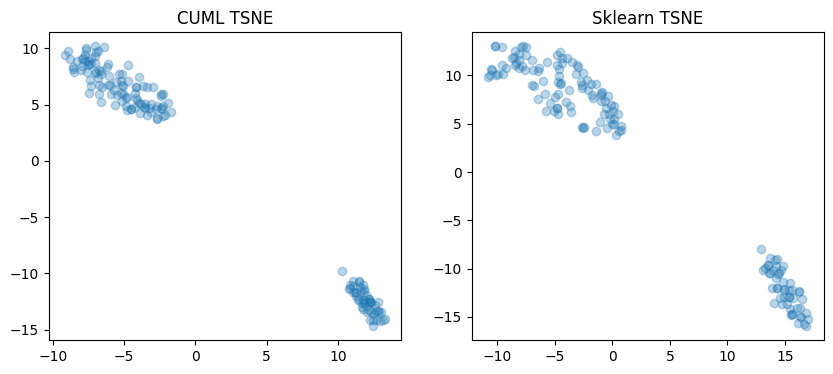

In [ ]:
# https://github.com/rapidsai/cuml/issues/2595

from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE as sklTSNE
from cuml.manifold import TSNE
import numpy as np
import pandas as pd
import cudf
import matplotlib.pyplot as plt
%matplotlib inline

the_data = datasets.load_iris()
dataset = the_data.data
scaler = StandardScaler()
dataset = scaler.fit_transform(dataset)

tsne = TSNE(learning_rate_method='none', perplexity=50, n_neighbors=32, n_iter=1000,random_state=1234)
X_embedded_cuml = np.array( tsne.fit_transform(cudf.DataFrame.from_pandas(pd.DataFrame(dataset))).to_pandas() )

#Sklearn
tsne_ = sklTSNE(random_state=1234)
X_embedded = tsne_.fit_transform(dataset)


plt.style.use('default')
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(10,4)
[ax1, ax2]=axs
axs[0].scatter(X_embedded_cuml[:,0],X_embedded_cuml[:,1], alpha=0.3)
axs[0].set_title('CUML TSNE')
axs[1].scatter(X_embedded[:,0],X_embedded[:,1], alpha=0.3)
axs[1].set_title('Sklearn TSNE')
plt.show()

T-sne from cuml library with parametrs: learning_rate_method='none', perplexity=50, n_neighbors=32, n_iter=1000,random_state=1234 provides the same result as sklearn tsne. Will use tsne from cuml.

In [ ]:
%%time
from cuml.manifold import TSNE
tsne = TSNE(learning_rate_method='none', perplexity=50, n_neighbors=32, n_iter=1000)
X_color_tsne = tsne.fit_transform(X_color)


[W] [20:02:34.226657] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
CPU times: user 14.3 s, sys: 12.6 s, total: 26.9 s
Wall time: 36.6 s


In [ ]:
%%time
from cuml.manifold import TSNE
tsne = TSNE(n_components = 2)
X_hat2 = tsne.fit_transform(X_efficientnet)

[W] [19:23:40.437568] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
CPU times: user 1min 5s, sys: 1min 6s, total: 2min 11s
Wall time: 2min 21s


In [ ]:
def tsne_transformation(data):
    """
    Return reduced tsne dataset
    """
    from cuml.manifold import TSNE
    tsne = TSNE(learning_rate_method='none', perplexity=50, n_neighbors=32, n_iter=1000)
    X_tsne = tsne.fit_transform(data)
    return X_tsne


# tsne dimension reduction color set
X_color_tsne = tsne_transformation(X_color)
X_color_std_tsne = tsne_transformation(X_color_std)
X_color_normed_tsne = tsne_transformation(X_color_normed)


[W] [06:23:49.503270] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
[W] [06:24:12.290418] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
[W] [06:24:33.867967] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


In [ ]:
X_color_tsne

array([[15.685206  ,  3.89105   ],
       [19.383787  ,  5.0821576 ],
       [ 5.4835305 , 10.079043  ],
       ...,
       [17.812609  , -6.975389  ],
       [16.996685  ,  0.65513766],
       [16.66036   ,  1.398971  ]], dtype=float32)

Reduced dimensions set Visualization

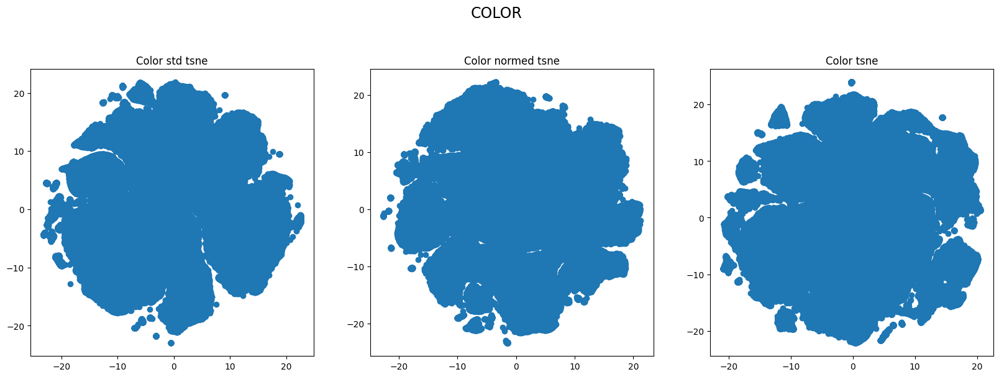

In [ ]:
def plot_n_visualisations_without_labels(n,data_low_dimentions_list,big_title,title_list):
    import matplotlib.pyplot as plt
    %matplotlib inline

    plt.style.use('default')
    fig, axs = plt.subplots(1, n)
    fig.set_size_inches(20,6)
    axes_list = ['ax'+str(i) for i in range(1,n+1)]
    axes_list = axs
    plt.suptitle(big_title, y=1.05, fontsize=17)

    for i in range(n):
        scatter = axs[i].scatter(data_low_dimentions_list[i][:,0], data_low_dimentions_list[i][:,1])
        axs[i].set_title(title_list[i])
    plt.show()

plot_n_visualisations_without_labels(3,[X_color_std_tsne,X_color_normed_tsne,X_color_tsne],'COLOR',['Color std tsne','Color normed tsne','Color tsne'])

Lets make our visualisation bigger to see clusters

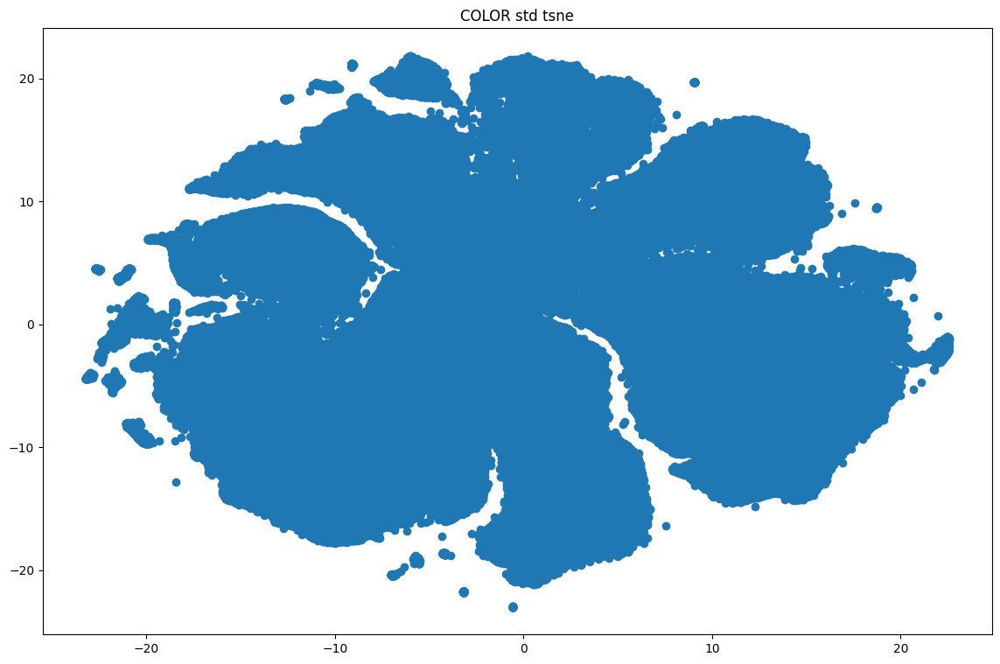

In [ ]:
def one_big_visualisation(data,title):
    """
    Plot one big 2D pic"""
    import matplotlib.pyplot as plt
    %matplotlib inline

    plt.style.use('default')
    fig, axs = plt.subplots(1, 1)
    fig.set_size_inches(14,9)
    plt.scatter(data[:,0], data[:,1])
    plt.title(title)
    plt.show()

one_big_visualisation(X_color_std_tsne,'COLOR std tsne')

### PCA dimension reduce

In [ ]:
def pca_2d(data):

    from sklearn.decomposition import PCA


    pca = PCA(n_components = 2)
    PCA_reduced = pca.fit_transform(data)
    print(PCA_reduced.shape)
    print('The proportion of the explained variance by the main components: {}'.format(pca.explained_variance_ratio_))
    print('Total proportion of the explained variance by the principal components', round(sum(pca.explained_variance_ratio_),3))
    return PCA_reduced

PCA_X_color_std_reduced = pca_2d(X_color_std)
PCA_X_color_normed_reduced = pca_2d(X_color_normed)

(416314, 2)
The proportion of the explained variance by the main components: [0.21577174 0.15101356]
Total proportion of the explained variance by the principal components 0.367
(416314, 2)
The proportion of the explained variance by the main components: [0.4309685  0.09661193]
Total proportion of the explained variance by the principal components 0.528


## Function framework

In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
import matplotlib.pyplot as plt
%matplotlib inline 
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
import numpy as np

def Kmeans_simple_exc(n_clusters,random_state, X):
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    kmeans.fit(X)
    return kmeans.predict(X)

# Mini-Batch K-Means clustering function

def MiniBatchKmeans_exc(n_clusters, batch_size, init, random_state, X):
    """
    Return prediction the closest cluster each sample in X belongs to (an array object).
    __________________
    Keyword arguments:
    n_clusters -- the number of clusters to form
    batch_size -- size of the mini batches
    init -- method for initialization ('k-means++','random')
    random_state -- random number generation for centroid initialization
    X -- data, an array object
    __________________
    Return:
    list of predictions
    """
    minibatch_kmeans = MiniBatchKMeans(n_clusters=n_clusters, batch_size=batch_size, random_state=random_state)
    minibatch_kmeans.fit(X)
    return minibatch_kmeans.predict(X)

def quality(X, labels):
  return calinski_harabasz_score(X, labels),  davies_bouldin_score(X, labels)

def print_quantity_clusters(labels):
    unique, counts = np.unique(labels, return_counts=True)
    print (np.asarray((unique, counts)).T)

def elbow(K,data):
    chs_list = []
    db_list = []
    iteria_list = []
    for i in K:
        kmeans = KMeans(n_clusters=i, random_state=0)
        kmeans.fit(data)
        chs,db = quality(data,kmeans.predict(data))
        chs_list.append(chs)
        db_list.append(db)
        iteria_list.append(kmeans.inertia_)
    plt.style.use('default')
    fig, axs = plt.subplots(1, 3)
    fig.set_size_inches(15,6)
    fig.suptitle('Elbow method')
    [ax1, ax2, ax3]=axs
    axs[0].plot(K, chs_list, 'bx-')
    axs[0].set_title('calinski harabasz score')
    axs[1].plot(K, db_list, 'bx-')
    axs[1].set_title('davies bouldin score')
    axs[2].plot(K, iteria_list, 'bx-')
    axs[2].set_title('sum of squared distances')
    plt.show()

def plot_n_visualisations(n,data_low_dimentions,cluste_labels_list,title_list):
    plt.style.use('default')
    fig, axs = plt.subplots(1, n)
    fig.set_size_inches(20,6)
    axes_list = ['ax'+str(i) for i in range(1,n+1)]
    axes_list = axs

    for i,j in enumerate(cluste_labels_list):
        scatter = axs[i].scatter(data_low_dimentions[:,0], data_low_dimentions[:,1],c=cluste_labels_list[i], label=np.unique(cluste_labels_list[i]))
        axs[i].legend(*scatter.legend_elements(),
                    loc="lower left", title="Clusters")
        axs[i].set_title(title_list[i])

def one_big_labeled_visualisation(data,clusters,title):
    """
    Plot one big 2D pic"""
    import matplotlib.pyplot as plt
    %matplotlib inline

    plt.style.use('default')
    fig, axs = plt.subplots(1, 1)
    fig.set_size_inches(14,9)
    plt.scatter(data[:,0], data[:,1],c=clusters, label=np.unique(clusters))
    plt.title(title)
    plt.show()

def plot_9_random_image(data,column,random):    
    import skimage.io
    import matplotlib.pyplot as plt
    %matplotlib inline

    for i in data[column].unique():
        plt.style.use('default')
        fig, axs = plt.subplots(1, 9)
        fig.set_size_inches(15,6)
        [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9]=axs
        fig.suptitle(column+ ' номер кластера: '+str(i), fontsize=22, y=0.67)
        for k,j in enumerate(data.loc[data[column]==i,'paths'].sample(n=9, random_state=random,replace=False)):
            adress = '/content/drive/MyDrive/01_Hackathon_09/raw_data/veriwild/'+j
            img = skimage.io.imread(adress) # вызываем модуль io и указываем имя файла нашего изображения, загружаем изображение
            axs[k].imshow(img) # отрисовываем изображение во внутренний буфер pyplot
    plt.show()
    

## Kmeans

**Сheck the running time of Kmeans**

7 clusters selected from the assumption of the number of colors in the rainbow

In [ ]:
#Посмотрим за сколько посчитатеся стандартный Kmeans)
%%time
kmeans_7_cluster_lbls_color = Kmeans_simple_exc(7,0,X_color)

CPU times: user 1min 38s, sys: 51.9 s, total: 2min 30s
Wall time: 1min 31s


**Selecting the number of clusters for standardized Kmeans default data**

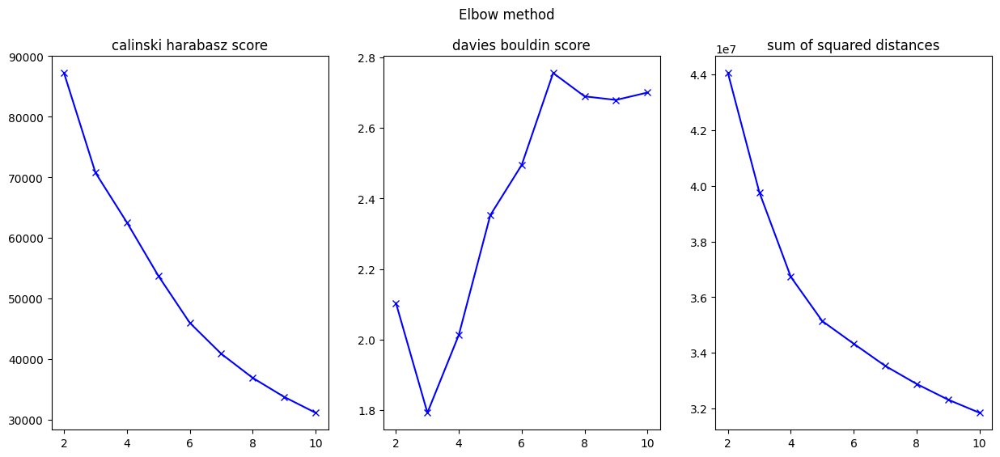

In [ ]:
elbow(range(2,11),X_color_std)

In [ ]:
import pandas as pd
result_kmeans_score_df = pd.DataFrame(index=['2_cluster','3_cluster','4_cluster','5_cluster','6_cluster'])

Кандидаты в оптимальное количество:4,5,6

In [ ]:
for i,j in zip(range(2,7),['2_cluster','3_cluster','4_cluster','5_cluster','6_cluster']):
  result_kmeans_score_df.loc[j,['ch_kmeans_color_std','db_kmeans_color_std']]  = quality(X_color_std, Kmeans_simple_exc(i,0,X_color_std))
result_kmeans_score_df

,ch_kmeans_color_std,db_kmeans_color_std
2_cluster,87224.229708,2.103178
3_cluster,70776.310211,1.792431
4_cluster,62565.657512,2.013269
5_cluster,53756.962282,2.352356
6_cluster,45997.365993,2.494932


**Kmeans с косинусным сходством подбор параметров**

There is no separate implementation of the cosine distance in Kmeans, but if you normalize the input data by the length of the feature vector, the Euclidean offset becomes cosine. The idea from [link](https://stats.stackexchange.com/questions/299013/cosine-distance-as-similarity-measure-in-kmeans).


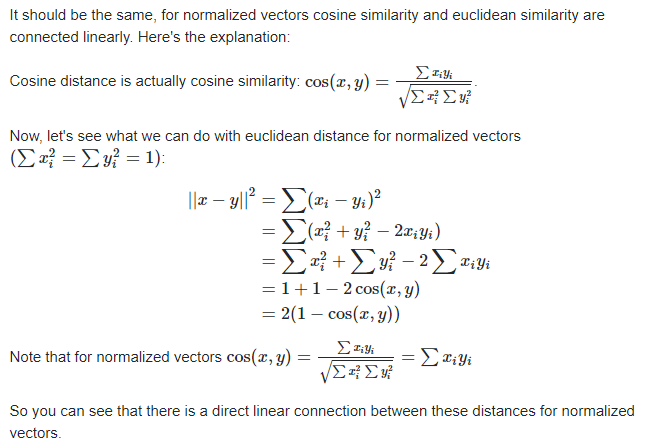

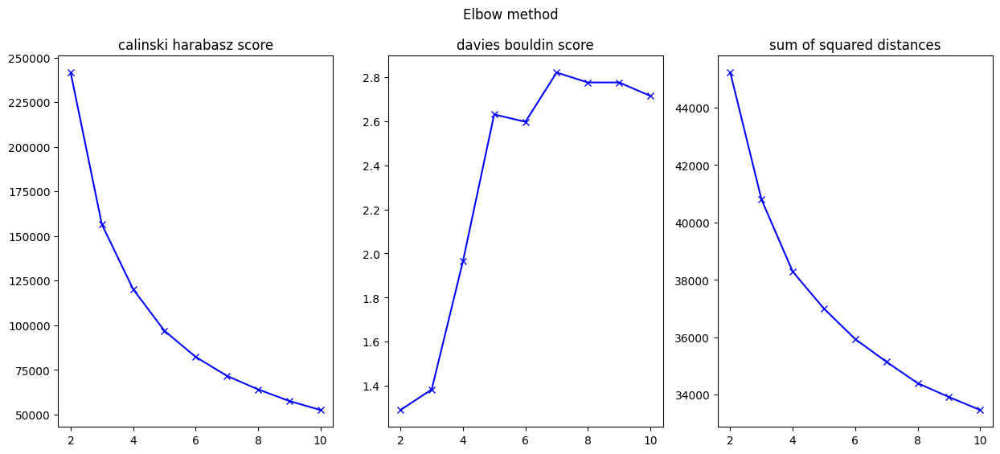

In [ ]:
elbow(range(2,11),X_color_normed)

Кандидаты в оптимальное число кластеров: 4,5,6

In [ ]:
for i,j in zip(range(2,7),['2_cluster','3_cluster','4_cluster','5_cluster','6_cluster']):
  result_kmeans_score_df.loc[j,['ch_kmeans_color_normed','db_kmeans_color_normed']]  = quality(X_color_normed, Kmeans_simple_exc(i,0,X_color_normed))
result_kmeans_score_df

,ch_kmeans_color_std,db_kmeans_color_std,ch_kmeans_color_normed,db_kmeans_color_normed
2_cluster,87224.229708,2.103178,241570.410718,1.289769
3_cluster,70776.310211,1.792431,156480.008218,1.383080
4_cluster,62565.657512,2.013269,120248.050196,1.964230
5_cluster,53756.962282,2.352356,96954.871266,2.630629
6_cluster,45997.365993,2.494932,82308.656201,2.597027


In [ ]:
import numpy as np

length_color = np.sqrt((X_color**2).sum(axis=1))[:,None]
X_color_normed = X_color / length_color

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_color_std = scaler.fit_transform(X_color)



kmeans_2_cluster_color_std = Kmeans_simple_exc(2,0,X_color_std)
kmeans_3_cluster_color_std = Kmeans_simple_exc(3,0,X_color_std)
kmeans_4_cluster_color_std = Kmeans_simple_exc(4,0,X_color_std)

kmeans_2_cluster_color_normed = Kmeans_simple_exc(2,0,X_color_normed)
kmeans_3_cluster_color_normed = Kmeans_simple_exc(3,0,X_color_normed)
kmeans_4_cluster_color_normed = Kmeans_simple_exc(4,0,X_color_normed)

kmeans_8_cluster_color_std = Kmeans_simple_exc(8,0,X_color_std)
kmeans_8_cluster_color_normed = Kmeans_simple_exc(8,0,X_color_normed)

print('\033[1mkmeans_2_cluster_color_std\033[0m')
print_quantity_clusters(kmeans_2_cluster_color_std)

print('\033[1mkmeans_3_cluster_color_std\033[0m')
print_quantity_clusters(kmeans_3_cluster_color_std)

print('\033[1mkmeans_4_cluster_color_std\033[0m')
print_quantity_clusters(kmeans_4_cluster_color_std)

print('\033[1mkmeans_2_cluster_color_normed\033[0m')
print_quantity_clusters(kmeans_2_cluster_color_normed)

print('\033[1mkmeans_3_cluster_color_normed\033[0m')
print_quantity_clusters(kmeans_3_cluster_color_normed)

print('\033[1mkmeans_4_cluster_color_normed\033[0m')
print_quantity_clusters(kmeans_4_cluster_color_normed)

print('\033[1mkmeans_8_cluster_color_std\033[0m')
print_quantity_clusters(kmeans_8_cluster_color_std)

print('\033[1mkmeans_8_cluster_color_normed\033[0m')
print_quantity_clusters(kmeans_8_cluster_color_normed)

kmeans_2_cluster_color_std
[[     0 210252]
 [     1 206062]]
kmeans_3_cluster_color_std
[[     0  23723]
 [     1 186935]
 [     2 205656]]
kmeans_4_cluster_color_std
[[     0 104746]
 [     1  23350]
 [     2 123570]
 [     3 164648]]
kmeans_2_cluster_color_normed
[[     0 217233]
 [     1 199081]]
kmeans_3_cluster_color_normed
[[     0 215794]
 [     1 172486]
 [     2  28034]]
kmeans_4_cluster_color_normed
[[     0  81686]
 [     1  27375]
 [     2 157634]
 [     3 149619]]
kmeans_8_cluster_color_std
[[    0 41116]
 [    1 76514]
 [    2 61230]
 [    3 49358]
 [    4 20386]
 [    5 51226]
 [    6 49471]
 [    7 67013]]
kmeans_8_cluster_color_normed
[[    0 61653]
 [    1 76294]
 [    2 60916]
 [    3 23033]
 [    4 47141]
 [    5 51907]
 [    6 26277]
 [    7 69093]]


### **Visualization of clustering results**

**TSNE**

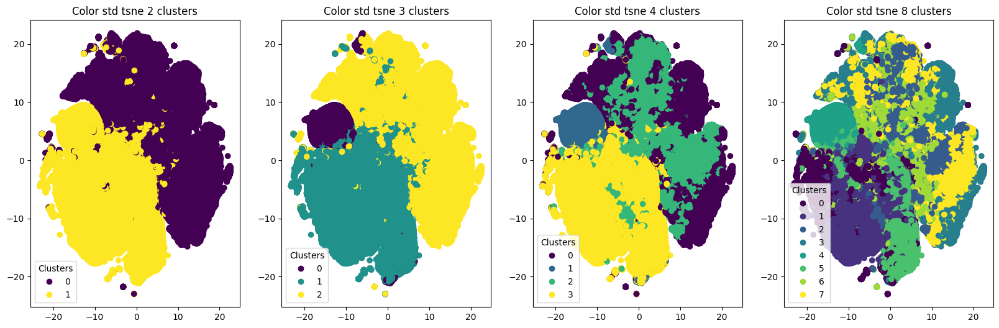

In [ ]:
plot_n_visualisations(4,X_color_std_tsne,[kmeans_2_cluster_color_std,kmeans_3_cluster_color_std,kmeans_4_cluster_color_std,kmeans_8_cluster_color_std],['Color std tsne 2 clusters','Color std tsne 3 clusters','Color std tsne 4 clusters','Color std tsne 8 clusters'])

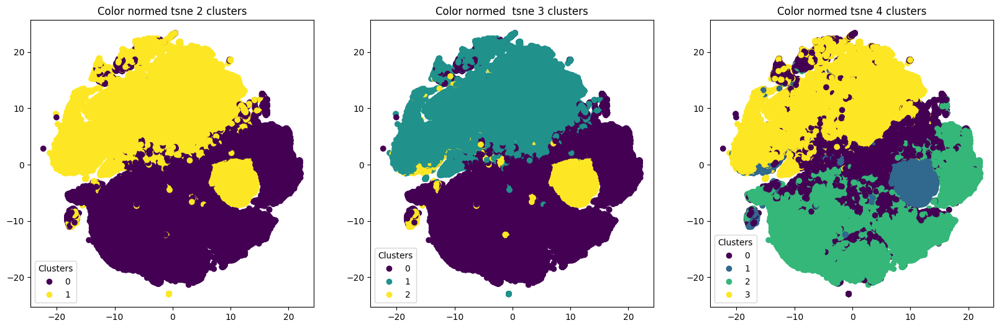

In [ ]:
plot_n_visualisations(3,X_color_std_tsne,[kmeans_2_cluster_color_normed,kmeans_3_cluster_color_normed,kmeans_4_cluster_color_normed],['Color normed tsne 2 clusters','Color normed  tsne 3 clusters','Color normed tsne 4 clusters'])

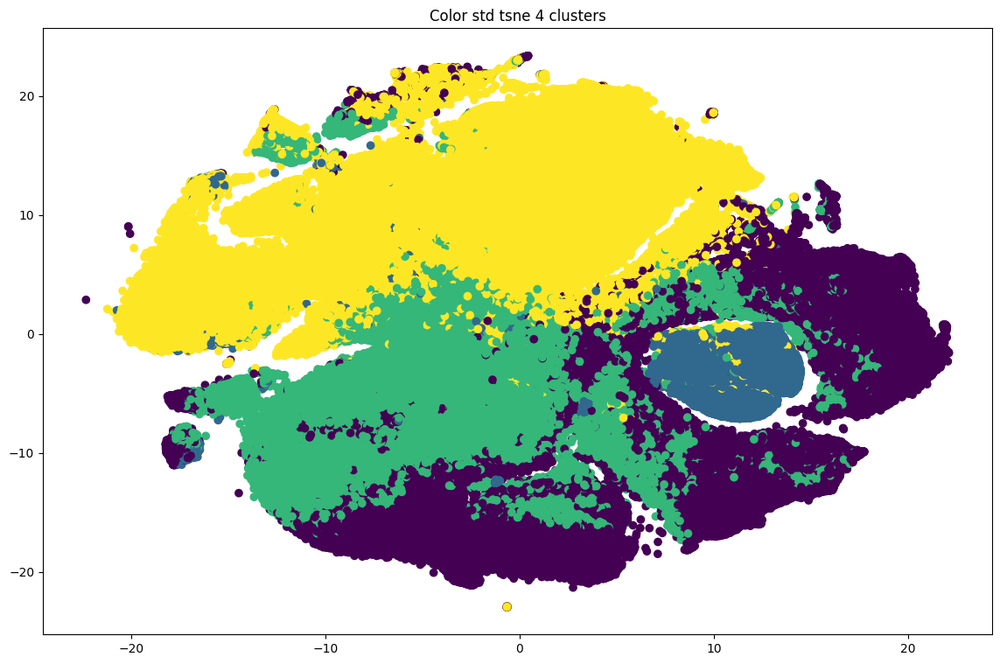

In [ ]:
one_big_labeled_visualisation(X_color_std_tsne,kmeans_4_cluster_color_std,'Color std tsne 4 clusters')

**PCA**

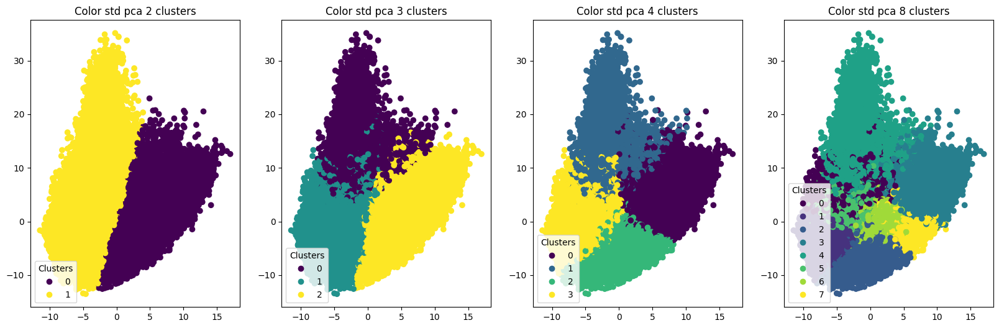

In [ ]:
plot_n_visualisations(4,PCA_X_color_std_reduced,[kmeans_2_cluster_color_std,kmeans_3_cluster_color_std,kmeans_4_cluster_color_std,kmeans_8_cluster_color_std],['Color std pca 2 clusters','Color std pca 3 clusters','Color std pca 4 clusters','Color std pca 8 clusters'])

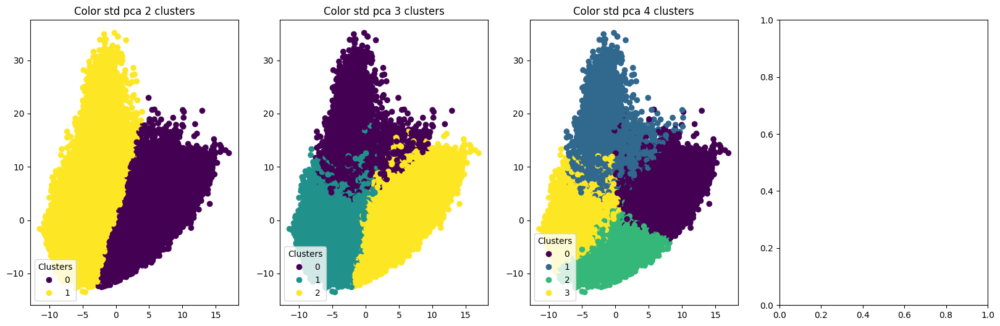

In [ ]:
plot_n_visualisations(4,PCA_X_color_std_reduced,[kmeans_2_cluster_color_std,kmeans_3_cluster_color_std,kmeans_4_cluster_color_std],['Color std pca 2 clusters','Color std pca 3 clusters','Color std pca 4 clusters'])

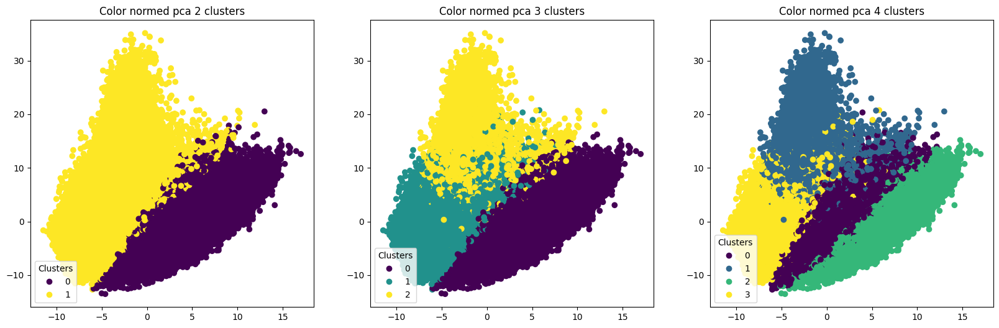

In [ ]:
plot_n_visualisations(3,PCA_X_color_std_reduced,[kmeans_2_cluster_color_normed,kmeans_3_cluster_color_normed,kmeans_4_cluster_color_normed],['Color normed pca 2 clusters','Color normed pca 3 clusters','Color normed pca 4 clusters'])

Interesting that with different data preprocessing, the division into 2 and 3 clusters occurred simila. However, for 4 clusters, the algorithm separate data differently depending on the preprocessing.

I wonder which preprocessing technics is the best. 

Hypothesis: for the color_formed 4 cluster data, the cosine similarity is more suitable for the loss function that was involved in the formation of descriptors. It can also be seen that PCA compression more clearly reflects the final clustering, perhaps this is due to the fact that the descriptors are obtained by a regression model, and PCA is a linear transformation.
_________________________________________________________________________
Интересно, что при разной предобработке данных деление на 2 и 3 кластера произошло похоже, линии разделения некоторых кластеров под другим углом. Однако на 4 кластера алгоритм рабивает данные по-разному в зависимости от предобработки.

 Интересно, какое разбиение лучшее. Гипотеза: для данных color_normed 4 кластера, тк косинусная похожесть больше подходит под  функцию потерь, которая участвовалала в формировании дескрипторов. Также видно, что сжатие PCA понятнее отражает итоговое разбиение на кластеры, возможно это из-за того, что дескрипторы получены регрессионной моделью, а PCA - это линейное преобразование.

### **Saving clusters**

In [ ]:
import pandas as pd

images_paths = pd.read_csv('/content/drive/MyDrive/01_Hackathon_09/images_paths.csv')
images_paths_parsed = pd.concat([images_paths,images_paths['paths'].str.split('\\',expand=True)],axis=1)
images_paths_final = images_paths.copy()
images_paths_final['paths'] = images_paths_final['paths'].str.replace('\\','/') 
images_paths_parsed[images_paths_parsed.duplicated(subset=[3])]


,paths,0,1,2,3


In [ ]:
images_paths_final['kmeans_2_cluster_color_std'] = kmeans_2_cluster_color_std
images_paths_final['kmeans_3_cluster_color_std'] = kmeans_3_cluster_color_std
images_paths_final['kmeans_4_cluster_color_std'] = kmeans_4_cluster_color_std
images_paths_final['kmeans_2_cluster_color_normed'] = kmeans_2_cluster_color_normed
images_paths_final['kmeans_3_cluster_color_normed'] = kmeans_3_cluster_color_normed
images_paths_final['kmeans_4_cluster_color_normed'] = kmeans_4_cluster_color_normed
images_paths_final['kmeans_8_cluster_color_std'] = kmeans_8_cluster_color_std
images_paths_final.head()

,paths,kmeans_2_cluster_color_std,kmeans_3_cluster_color_std,kmeans_4_cluster_color_std,kmeans_2_cluster_color_normed,kmeans_3_cluster_color_normed,kmeans_4_cluster_color_normed,kmeans_8_cluster_color_std
0,veriwild/1/00001/000001.jpg,0,2,0,0,0,2,7
1,veriwild/1/00001/000002.jpg,0,2,0,0,0,2,3
2,veriwild/1/00001/000003.jpg,0,2,2,0,0,2,7
3,veriwild/1/00001/000004.jpg,0,2,0,0,0,2,7
4,veriwild/1/00001/000005.jpg,0,2,2,0,0,2,7


### **Plotting pictures**

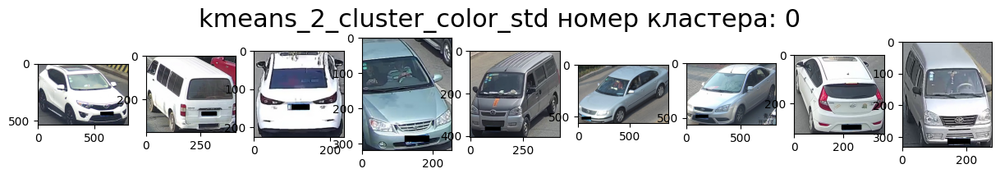

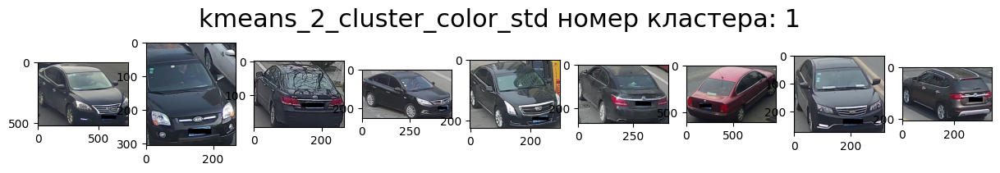

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_2_cluster_color_std',1)

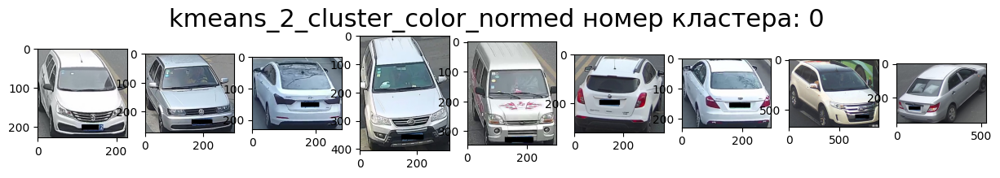

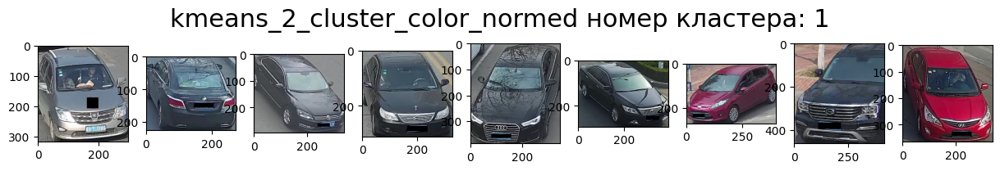

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_2_cluster_color_normed',100)

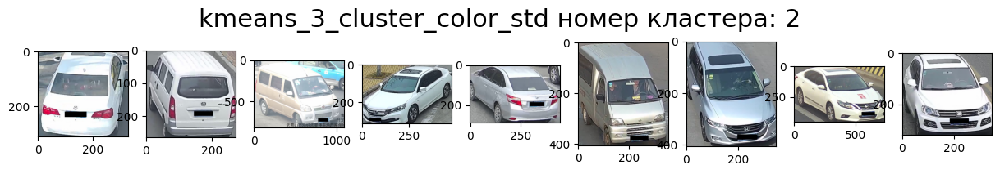

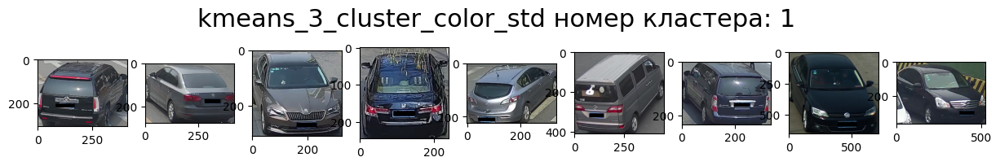

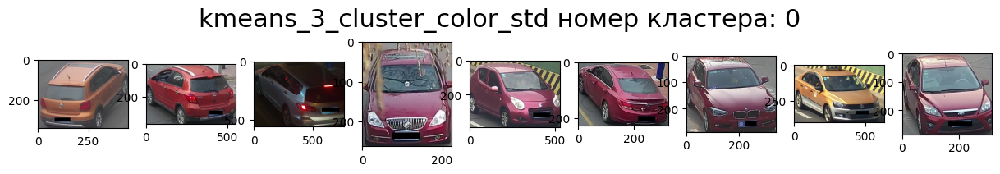

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_3_cluster_color_std',100)

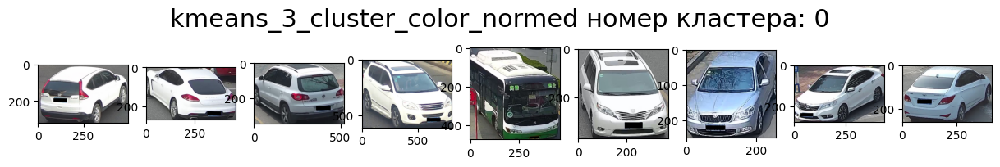

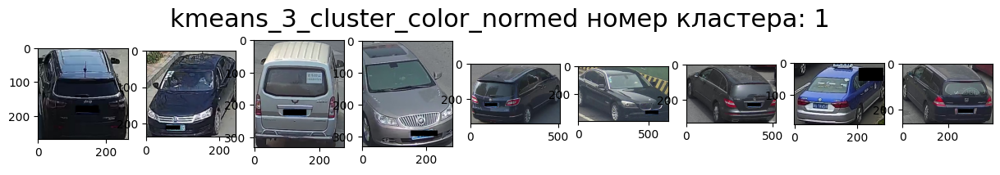

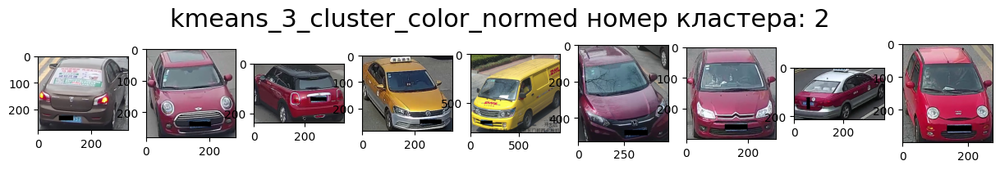

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_3_cluster_color_normed',400)

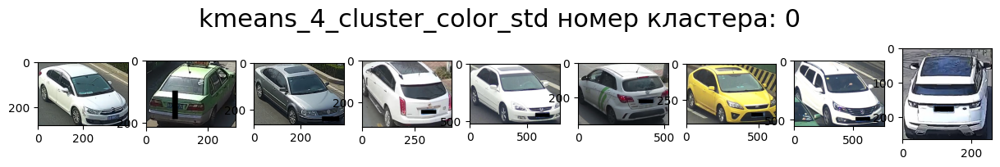

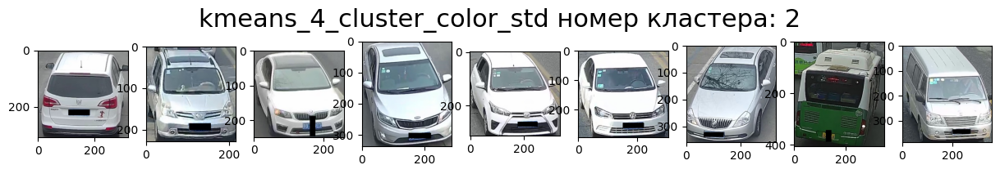

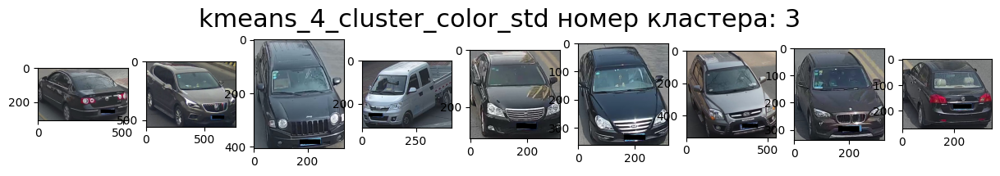

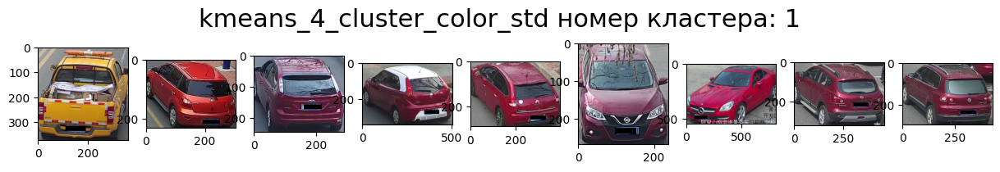

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_4_cluster_color_std',1230)

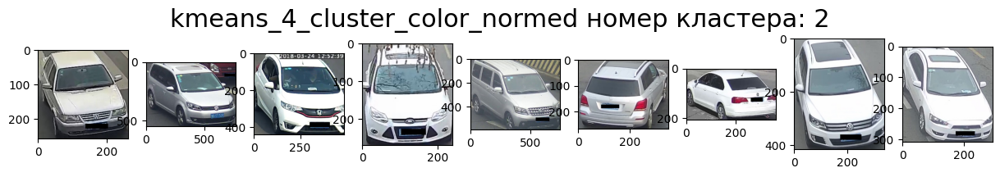

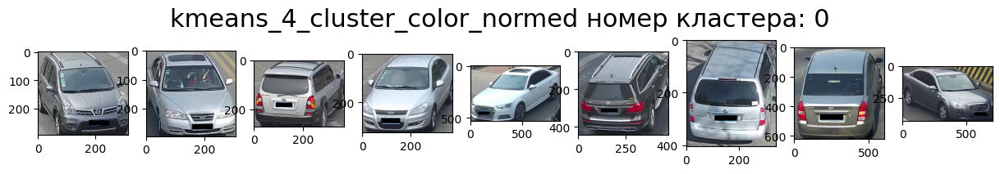

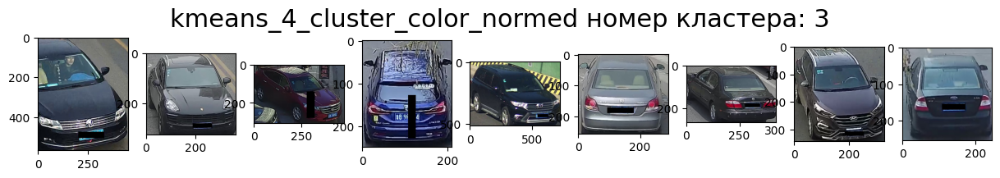

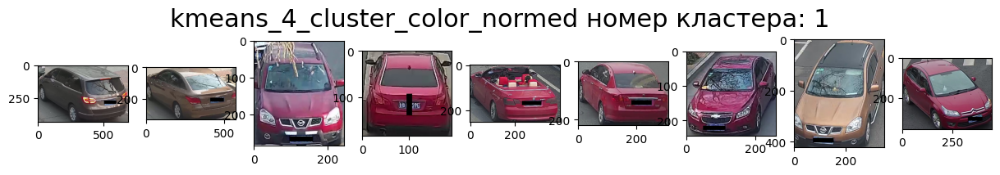

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_4_cluster_color_normed',1230)

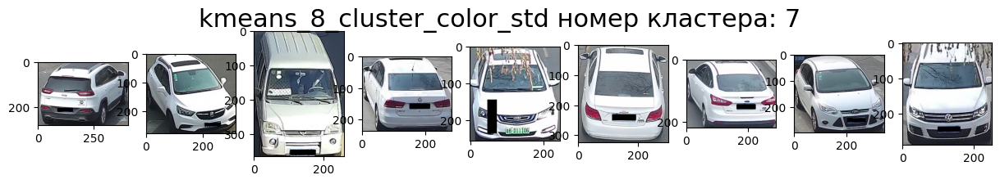

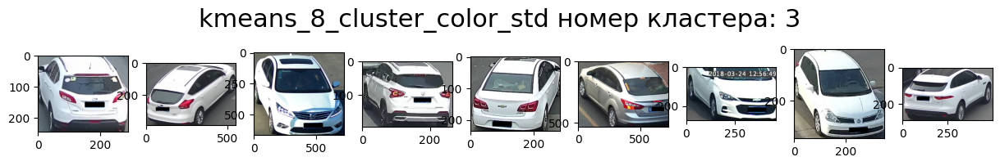

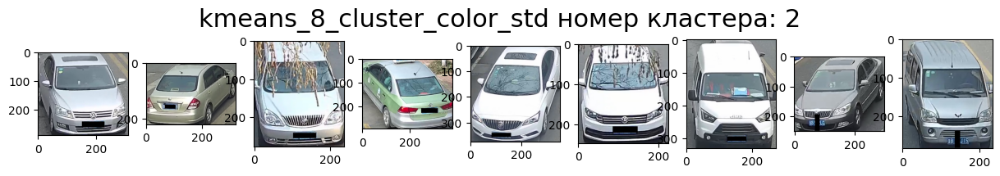

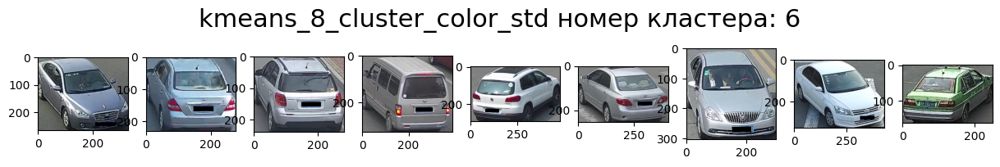

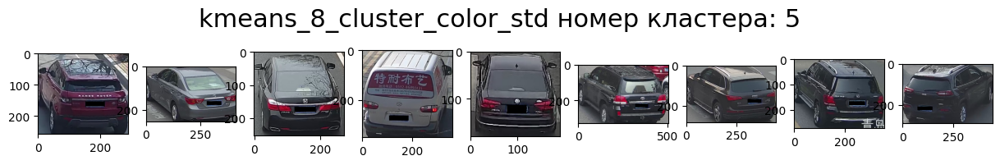

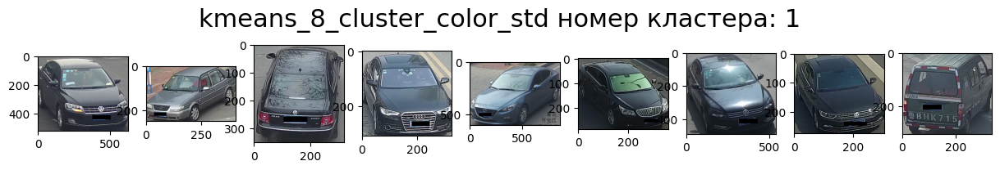

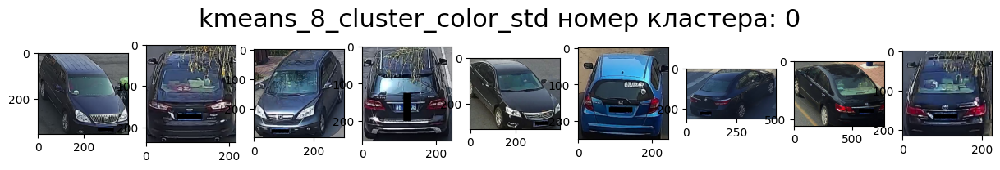

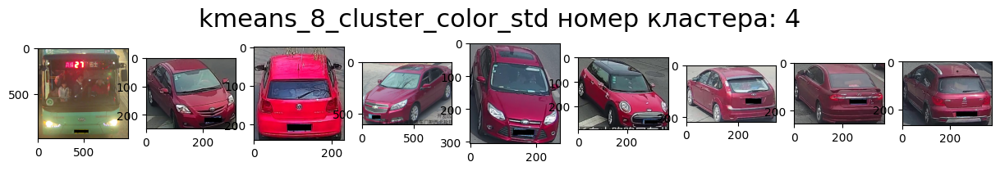

In [ ]:
plot_9_random_image(images_paths_final,'kmeans_8_cluster_color_std',1230)

splitting into 8 clusters does not give an increase in information

## DBSCAN for standartizing data


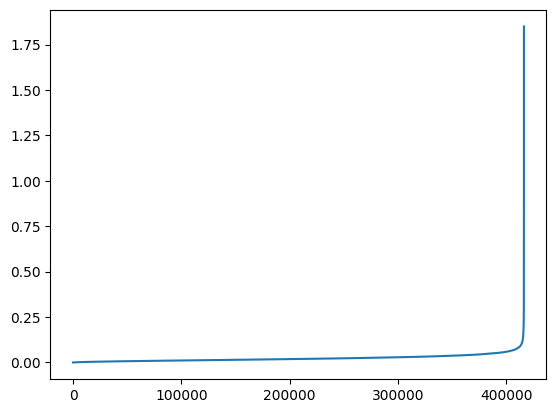

In [ ]:
# how to choose eps https://medium.com/@tarammullin/dbscan-parameter-estimation-ff8330e3a3bd
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt


neighbors = NearestNeighbors(n_neighbors=700)
neighbors_fit = neighbors.fit(X_color_std_tsne)
distances, indices = neighbors_fit.kneighbors(X_color_std_tsne)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
from cuml.cluster import DBSCAN

dbscan_float = DBSCAN(eps =0.5, min_samples = 10)
dbscan_float.fit(X_color_std_tsne)
print_quantity_clusters(dbscan_float.labels_)
dbscan_color_std_tsne_lbls = dbscan_float.labels_

[W] [13:40:20.535867] Batch size limited by the chosen integer type (4 bytes). 6244 -> 5158. Using the larger integer type might result in better performance
[[    -1     29]
 [     0 406004]
 [     1    249]
 [     2   3113]
 [     3    815]
 [     4   2616]
 [     5    513]
 [     6    100]
 [     7    268]
 [     8    438]
 [     9    135]
 [    10    157]
 [    11    483]
 [    12    238]
 [    13    147]
 [    14    530]
 [    15     51]
 [    16     44]
 [    17    121]
 [    18    229]
 [    19     34]]


### **Visualization of clustering results**

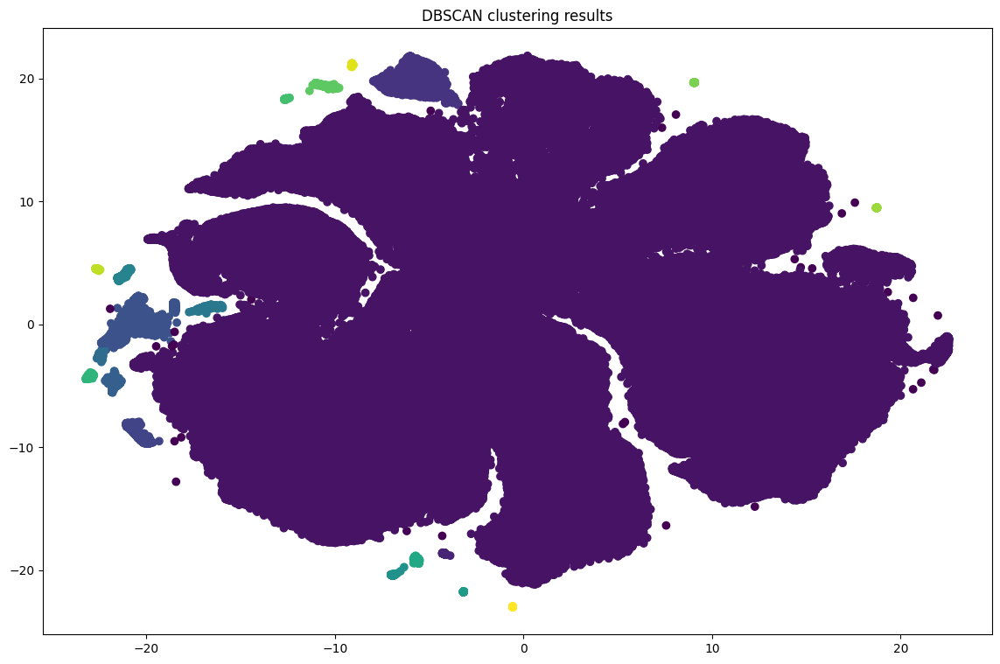

In [ ]:
one_big_labeled_visualisation(X_color_std_tsne,dbscan_color_std_tsne_lbls,'DBSCAN clustering results')

we will select only the largest cluster and try to restart dbscan on it

In [ ]:
#Отбираем больший кластер
dbscan_union = np.hstack((X_color_std_tsne,dbscan_color_std_tsne_lbls.reshape(-1,1)))
dbscan_filtered = dbscan_union[dbscan_union[:,2]==0]
dbscan_filtered = dbscan_filtered[:,0:2]
dbscan_filtered

array([[ 10.1268034 , -13.65072727],
       [ 14.49372578, -13.37058735],
       [ -4.88122225,  15.31292152],
       ...,
       [ 17.44623947,  -3.10576749],
       [ 13.60700321,  -8.96891689],
       [ 13.02941799,  -9.32990646]])

In [ ]:
dbscan_float2 = DBSCAN(eps =0.5, min_samples = 10)
dbscan_float2.fit(dbscan_filtered)
print_quantity_clusters(dbscan_float2.labels_)

[W] [13:44:27.220033] Batch size limited by the chosen integer type (4 bytes). 6402 -> 5289. Using the larger integer type might result in better performance
[[     0 406004]]


selecting the biggest cluster for clusterization does not dive better result

In [ ]:
ch_dbscan_color_std,db_dbscan_color_std = quality(X_color_std, dbscan_color_std_tsne_lbls)
result_kmeans_score_df_dbscan=pd.DataFrame(index=[0])
result_kmeans_score_df_dbscan['ch_dbscan_color_std_tsne'] = ch_dbscan_color_std
result_kmeans_score_df_dbscan['db_dbscan_color_std_tsne'] = db_dbscan_color_std
result_kmeans_score_df_dbscan

,ch_dbscan_color_std_tsne,db_dbscan_color_std_tsne
0,681.058754,2.399613


### **Saving clusters**

In [ ]:
images_paths_final['dbscan_color_std'] = dbscan_color_std_tsne_lbls
images_paths_final.to_csv('images_paths_final_color.csv')

It's looks like BBSCAN trying to find outliers. Let's visualise our results


### **Plotting pictures**

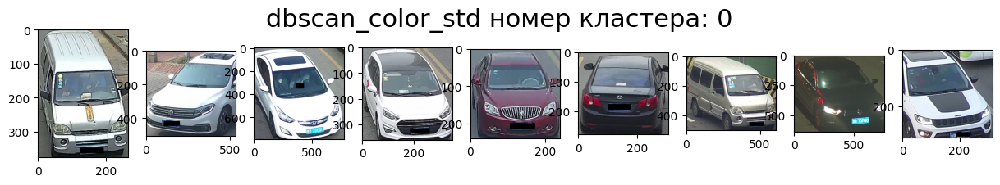

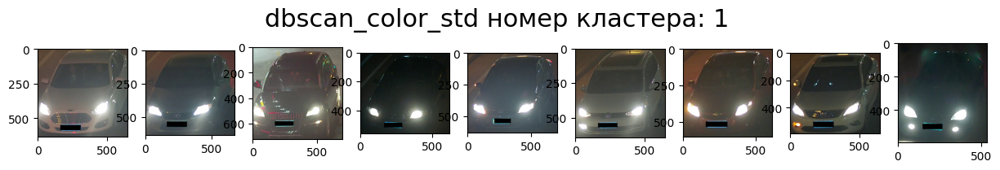

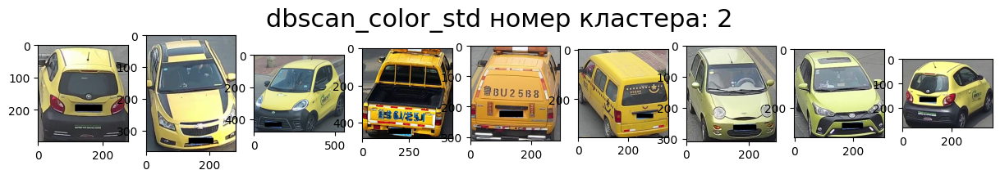

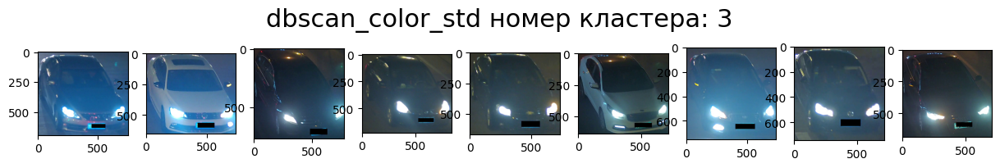

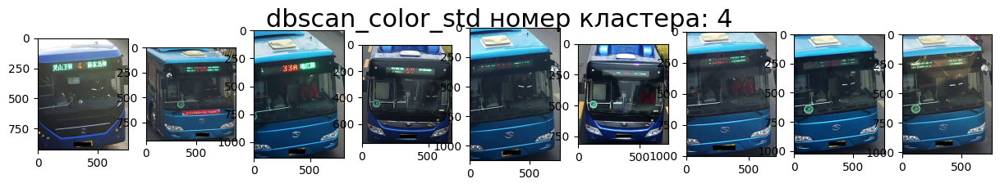

...

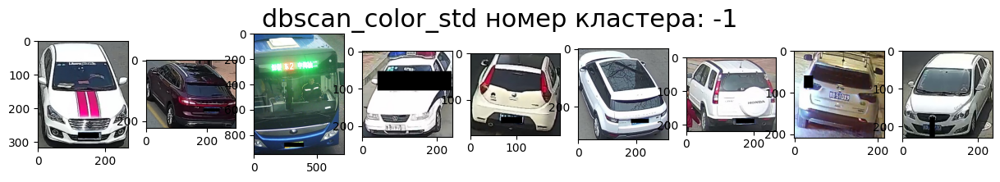

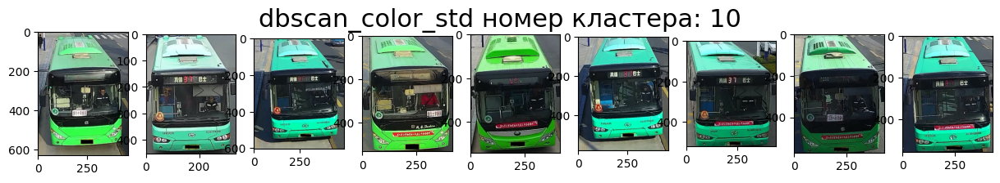

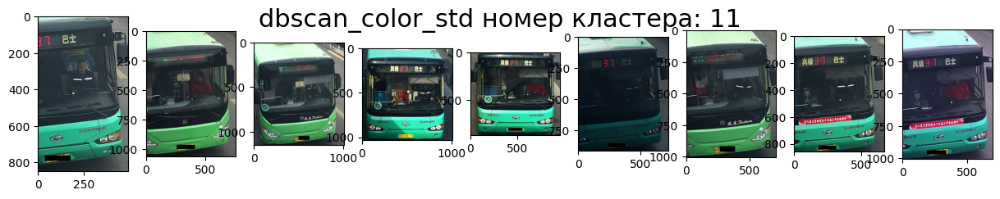

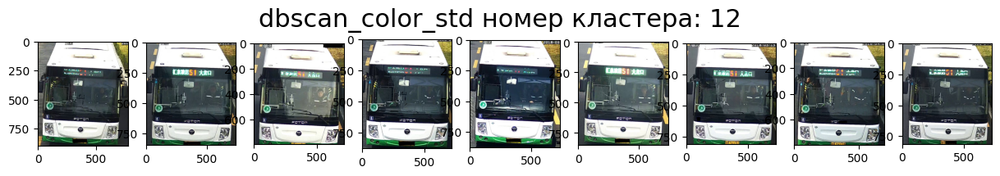

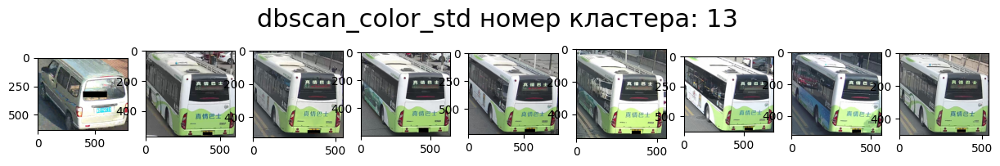

In [ ]:
images_paths_final['dbscan_color_std'] = dbscan_color_std_tsne_lbls
plot_9_random_image(images_paths_final,'dbscan_color_std',1230)

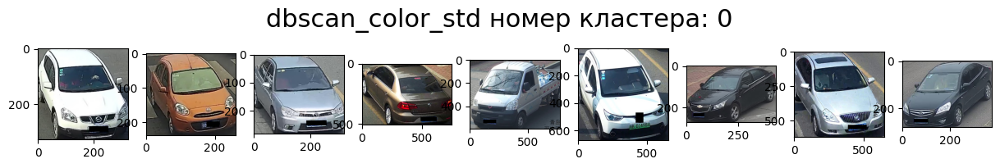

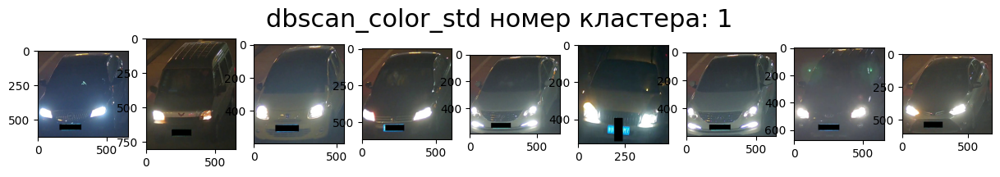

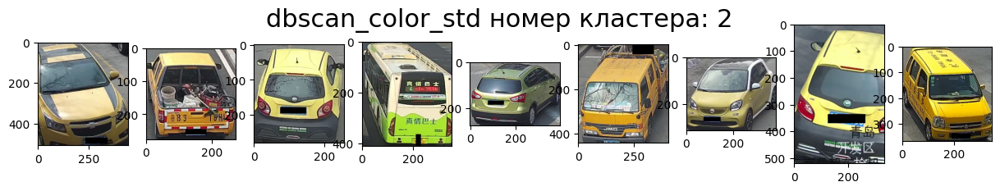

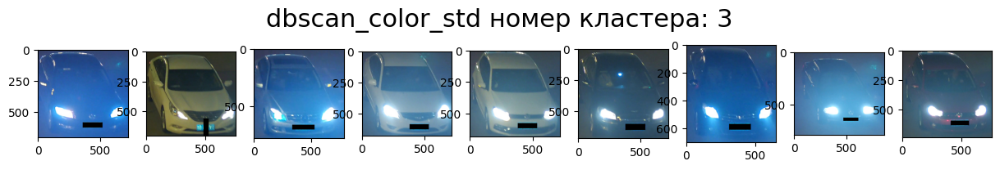

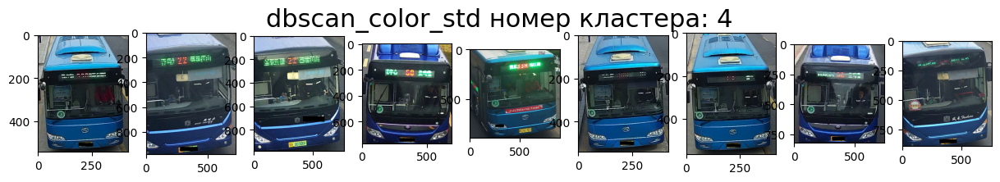

...

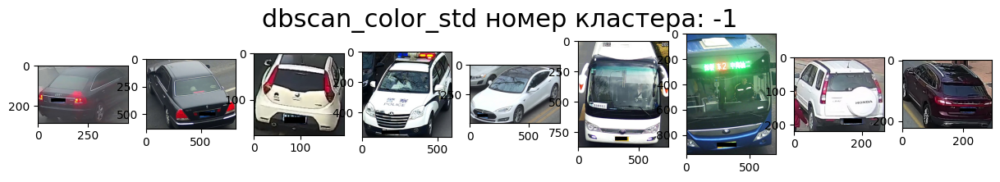

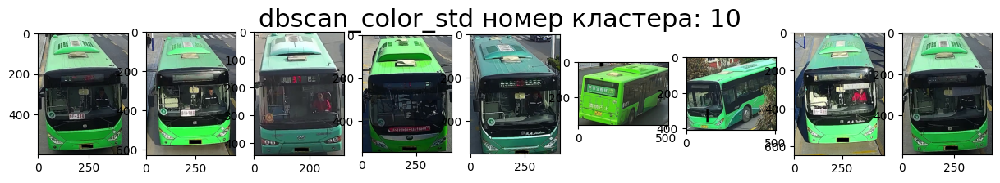

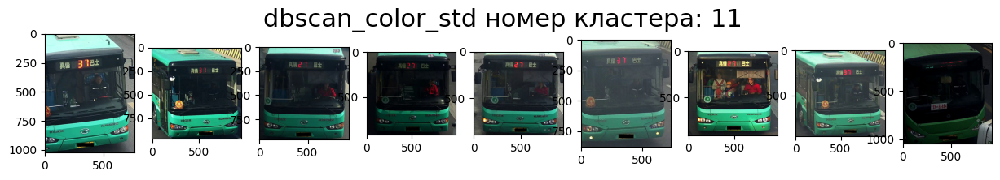

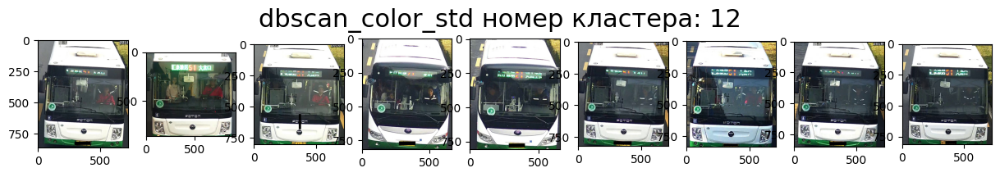

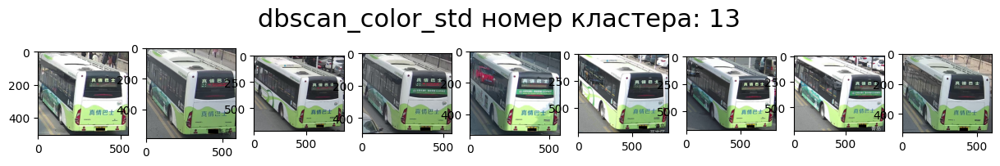

In [ ]:
#Запуск с другим randomseed проверить не изменилась ли тенденция
plot_9_random_image(images_paths_final,'dbscan_color_std',123)